# DCT Conversion

In [12]:

%load_ext autoreload
%autoreload 2

import os
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
from typing import Union, Tuple

from timm.layers import to_2tuple

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

from jutils import ims_to_grid
from jutils.nn import AutoencoderKL
from jutils import tensor2im, freeze

while not os.path.exists('ldm'):
    %cd ..
assert os.path.exists('ldm')

from experiments.utils.utility import denorm_tensor
from ldm.dataloader.dataloader.dataloader import HDF5MultiDataModule, HDF5DataModule


DEV = 'cuda:2'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# SD-AE with 32x32 input
vae = AutoencoderKL(ckpt_path="checkpoints/sd_ae.ckpt")

[AutoencoderKL] Loading checkpoint from checkpoints/sd_ae.ckpt


In [3]:

# Code taken from Torch-DCT Repo
# https://github.com/zh217/torch-dct/blob/master/torch_dct/_dct.py#L12
# 
# 
def dct_fft_impl(v):
    return torch.view_as_real(torch.fft.fft(v, dim=1))

def idct_irfft_impl(V):
    return torch.fft.irfft(torch.view_as_complex(V), n=V.shape[1], dim=1)


""" Discrete Cosine Transform, Type II (a.k.a. the DCT) """
    
    
def idct(X, norm=None):
    """
    The inverse to DCT-II, which is a scaled Discrete Cosine Transform, Type III

    Our definition of idct is that idct(dct(x)) == x

    For the meaning of the parameter `norm`, see:
    https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.fftpack.dct.html

    :param X: the input signal
    :param norm: the normalization, None or 'ortho'
    :return: the inverse DCT-II of the signal over the last dimension
    """

    x_shape = X.shape
    N = x_shape[-1]

    X_v = X.contiguous().view(-1, x_shape[-1]) / 2

    if norm == 'ortho':
        X_v[:, 0] *= np.sqrt(N) * 2
        X_v[:, 1:] *= np.sqrt(N / 2) * 2

    k = torch.arange(x_shape[-1], dtype=X.dtype, device=X.device)[None, :] * np.pi / (2 * N)
    W_r = torch.cos(k)
    W_i = torch.sin(k)

    V_t_r = X_v
    V_t_i = torch.cat([X_v[:, :1] * 0, -X_v.flip([1])[:, :-1]], dim=1)

    V_r = V_t_r * W_r - V_t_i * W_i
    V_i = V_t_r * W_i + V_t_i * W_r

    V = torch.cat([V_r.unsqueeze(2), V_i.unsqueeze(2)], dim=2)

    v = idct_irfft_impl(V)
    x = v.new_zeros(v.shape)
    x[:, ::2] += v[:, :N - (N // 2)]
    x[:, 1::2] += v.flip([1])[:, :N // 2]

    return x.view(*x_shape)


def dct(x, norm=None):
    """
    Discrete Cosine Transform, Type II (a.k.a. the DCT)

    For the meaning of the parameter `norm`, see:
    https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.fftpack.dct.html

    :param x: the input signal
    :param norm: the normalization, None or 'ortho'
    :return: the DCT-II of the signal over the last dimension
    """
    x_shape = x.shape
    N = x_shape[-1]
    x = x.contiguous().view(-1, N)

    v = torch.cat([x[:, ::2], x[:, 1::2].flip([1])], dim=1)

    Vc = dct_fft_impl(v)

    k = - torch.arange(N, dtype=x.dtype, device=x.device)[None, :] * np.pi / (2 * N)
    W_r = torch.cos(k)
    W_i = torch.sin(k)

    V = Vc[:, :, 0] * W_r - Vc[:, :, 1] * W_i

    if norm == 'ortho':
        V[:, 0] /= np.sqrt(N) * 2
        V[:, 1:] /= np.sqrt(N / 2) * 2

    V = 2 * V.view(*x_shape)

    return V


def dct_2d(x, norm=None):
    """
    2-dimentional Discrete Cosine Transform, Type II (a.k.a. the DCT)

    For the meaning of the parameter `norm`, see:
    https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.fftpack.dct.html

    :param x: the input signal
    :param norm: the normalization, None or 'ortho'
    :return: the DCT-II of the signal over the last 2 dimensions
    """
    X1 = dct(x, norm=norm)
    X2 = dct(X1.transpose(-1, -2), norm=norm)    
    return X2.transpose(-1, -2)


def idct_2d(X, norm=None):
    """
    The inverse to 2D DCT-II, which is a scaled Discrete Cosine Transform, Type III

    Our definition of idct is that idct_2d(dct_2d(x)) == x

    For the meaning of the parameter `norm`, see:
    https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.fftpack.dct.html

    :param X: the input signal
    :param norm: the normalization, None or 'ortho'
    :return: the DCT-II of the signal over the last 2 dimensions
    """
    x1 = idct(X, norm=norm)
    x2 = idct(x1.transpose(-1, -2), norm=norm)
    return x2.transpose(-1, -2)


def split_low_high_dct(x, low_ratio=0.25, norm=None):
    """
    Splits input into low and high frequency components using 2D DCT.

    Args:
        x (Tensor): Input tensor of shape (B, C, H, W)
        low_ratio (float): Ratio for low frequency cutoff (0 < low_ratio <= 1)
        norm (str): DCT normalization mode (None or 'ortho')

    Returns:
        low_freq (Tensor): Low frequency image (B, C, H, W)
        high_freq (Tensor): High frequency image (B, C, H, W)
    """
    B, C, H, W = x.shape
    dct_out = dct_2d(x, norm=norm)  # Apply 2D DCT

    # Create low-pass mask
    cutoff_h = int(H * low_ratio)
    cutoff_w = int(W * low_ratio)
    mask = torch.zeros_like(dct_out)
    mask[:, :, :cutoff_h, :cutoff_w] = 1.0

    # Apply masks
    low_dct = dct_out * mask
    high_dct = dct_out * (1 - mask)

    # Inverse DCT
    low_freq = idct_2d(low_dct, norm=norm)
    high_freq = idct_2d(high_dct, norm=norm)

    return low_freq, high_freq


-------
### Utility Functions

In [4]:
def show_grid(img: torch.Tensor):
    ims = denorm_tensor(img.detach().cpu())
    
    grid = torchvision.utils.make_grid(ims, nrow=4, padding=0)
    grid = grid.permute(1, 2, 0).numpy()  # Convert to HWC format
    
    plt.figure(figsize=(5, 5))
    plt.imshow(grid)
    plt.axis('off')
    plt.show()
    
    
    
def show(img: torch.Tensor, save_to=None) -> None:
    img = img.clone().to(torch.float32)
    
    # Normalize the image to [0, 1]
    min, max = img.min(), img.max()
    img.clamp_(min=min, max=max)
    img.add_(-min).div_(max - min + 1e-5)
    
    # Convert to NumPy
    fig = plt.figure(figsize=(20, 8))
    plt.imshow(img.detach().cpu().permute(1, 2, 0).numpy(), interpolation='nearest')
    plt.xticks([])
    plt.yticks([])
    
    if save_to is not None:
        plt.imsave(save_to, img.detach().cpu().permute(1, 2, 0).numpy())
    plt.show()
    plt.close(fig)

------
### Sanity Test

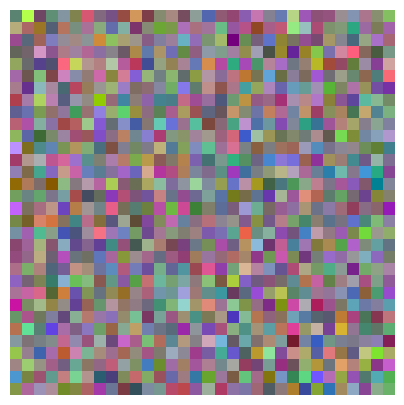

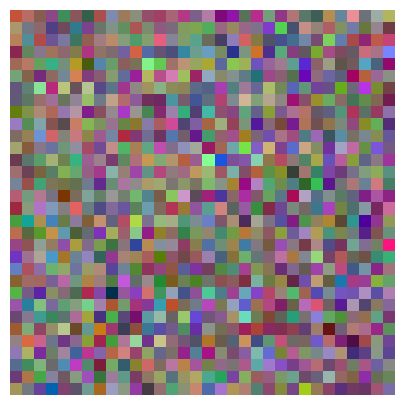

In [ ]:
ipt = torch.randn(1, 4, 32, 32).to(DEV)
dct_image = dct_2d(ipt, norm='ortho')
show_grid(dct_image)

recon_img = idct_2d(dct_image, norm='ortho')
show_grid(recon_img)


mse = F.mse_loss(recon_img, latents)
print(f"MSE: {mse}")

-----
### Load Data

[HDF5DataModule] Setting base directory to /export/home/ra93jiz/dev/Img-IDM/dataset/processed/needs-fix/imagenet256_data.hdf5
[HDF5LatentsDataset] Dataset size: 358531
[HDF5LatentsDataset] Dataset size: 159936
image      torch.Size([16, 3, 256, 256])
latent     torch.Size([16, 4, 32, 32])
label      torch.Size([16, 1])
Min images: -1.00, Max images: 1.01


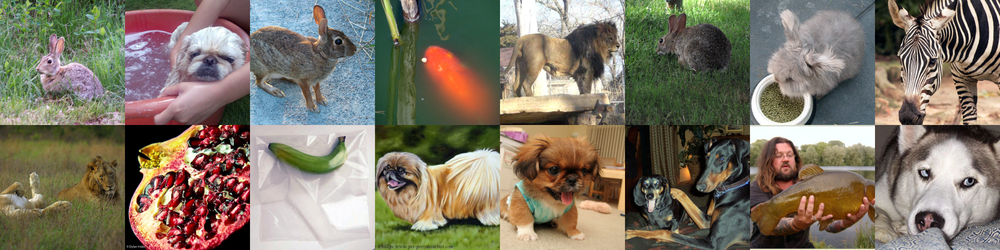

In [10]:
timestep = 0.5
data_dir = './dataset/processed/needs-fix/imagenet256_data.hdf5'

batch_size = 16
data = HDF5DataModule(
            base_dir=data_dir,
            batch_size=batch_size,
            num_workers=2
        )
data.setup(stage='fit')
for batch in data.train_dataloader():
    for k, v in batch.items():
        if isinstance(v, torch.Tensor) or isinstance(v, np.ndarray):
            print(f"{k:<10} {v.shape}")
        elif isinstance(v, list):
            print(f"{k:<10} [{v[0]}, ...]")
        else:
            print(f"{k:<10} {type(v)}")
    break

# Select single batch 
latents = batch['latent']
images = batch['image']
labels = batch['label']

print(f"Min images: {images.min():.2f}, Max images: {images.max():.2f}")

ims = tensor2im(images)
ims = ims_to_grid(ims, split=2, channel_last=True)
Image.fromarray(ims).show()

-----------
### Prepare VAE Embedded Latents

In [58]:
vae = vae.to(DEV)
latents_x1 = vae.encode(images.to(DEV))

In [60]:
print(f"Shape of latents_x1: {latents_x1.shape}")

Shape of latents_x1: torch.Size([16, 4, 32, 32])


--------
### Sanity Check

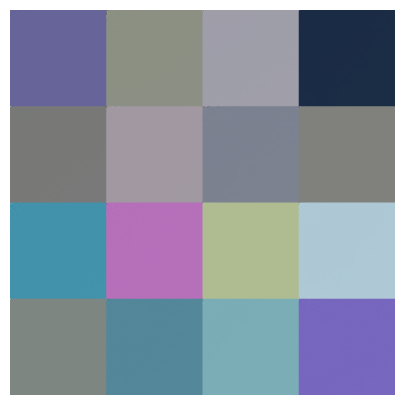

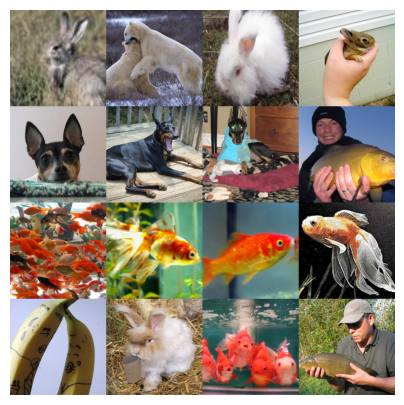

In [ ]:
dct_image = dct_2d(images, norm='ortho')
show_grid(dct_image)


recon_img = idct_2d(dct_image, norm='ortho')
show_grid(recon_img)


mse = F.mse_loss(recon_img, latents)
print(f"MSE: {mse}")

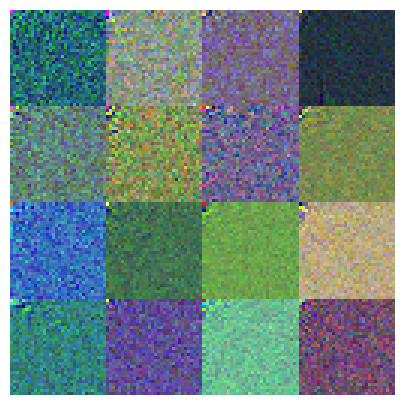

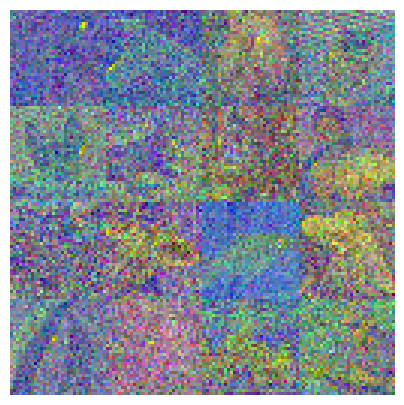

In [ ]:
dct_image = dct_2d(latents, norm='ortho')
show_grid(dct_image)


recon_img = idct_2d(dct_image, norm='ortho')
show_grid(recon_img)

mse = F.mse_loss(recon_img, latents)
print(f"MSE: {mse}")

-------
### Removal of low-frequencies

In [7]:
import numpy as np
import torch
import cv2

def dct_transform(blocks):
    dct_blocks = []
    for block in blocks:
        block = np.float32(block) - 128
        dct_block = cv2.dct(block)
        dct_blocks.append(dct_block)
    return np.array(dct_blocks)

def idct_transform(blocks):
    idct_blocks = []
    for block in blocks:
        idct_block = cv2.idct(block)
        idct_block = idct_block + 128
        idct_blocks.append(idct_block)
    return np.array(idct_blocks)


""" High-frequency extraction using DCT """
def extract_high_frequencies_cv2(x, block_size=8, high_freqs=8):
    B, C, H, W = x.shape
    high_freqs_output = torch.zeros_like(x)
    
    for b in range(B):
        for c in range(C):
            img = x[b, c].cpu().numpy()
            blocks = [img[i:i+block_size, j:j+block_size] for i in range(0, H, block_size) for j in range(0, W, block_size)]
            dct_blocks = dct_transform(blocks)
            
            for i in range(len(dct_blocks)):
                block = dct_blocks[i]
                block[0:high_freqs, 0:high_freqs] = 0
                dct_blocks[i] = block
            
            idct_blocks = idct_transform(dct_blocks)
            reconstructed_img = np.zeros_like(img)
            idx = 0
            for i in range(0, H, block_size):
                for j in range(0, W, block_size):
                    reconstructed_img[i:i+block_size, j:j+block_size] = idct_blocks[idx]
                    idx += 1
            
            high_freqs_output[b, c] = torch.tensor(reconstructed_img).float()
    
    return high_freqs_output


""" Low-frequency extraction using DCT """
def extract_low_frequencies_cv2(x, block_size=8, low_freqs=8):
    B, C, H, W = x.shape
    low_freqs_output = torch.zeros_like(x)
    
    for b in range(B):
        for c in range(C):
            img = x[b, c].cpu().numpy()
            blocks = [img[i:i+block_size, j:j+block_size] for i in range(0, H, block_size) for j in range(0, W, block_size)]
            dct_blocks = dct_transform(blocks)
            
            for i in range(len(dct_blocks)):
                block = dct_blocks[i]
                block[low_freqs:, low_freqs:] = 0
                dct_blocks[i] = block
            
            idct_blocks = idct_transform(dct_blocks)
            reconstructed_img = np.zeros_like(img)
            idx = 0
            for i in range(0, H, block_size):
                for j in range(0, W, block_size):
                    reconstructed_img[i:i+block_size, j:j+block_size] = idct_blocks[idx]
                    idx += 1
            
            low_freqs_output[b, c] = torch.tensor(reconstructed_img).float()
    
    return low_freqs_output


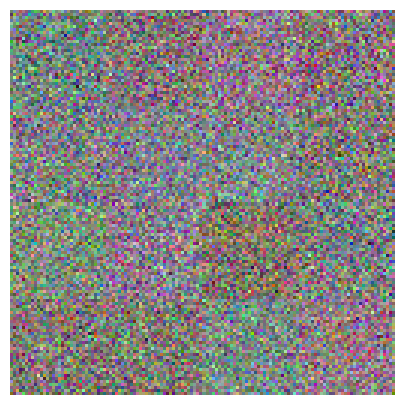

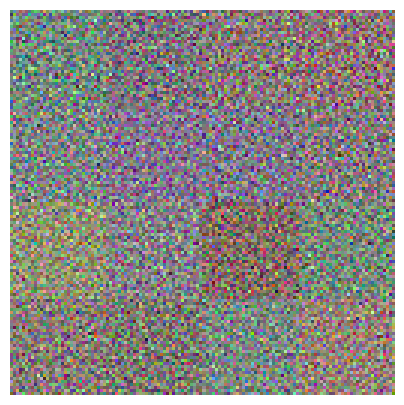

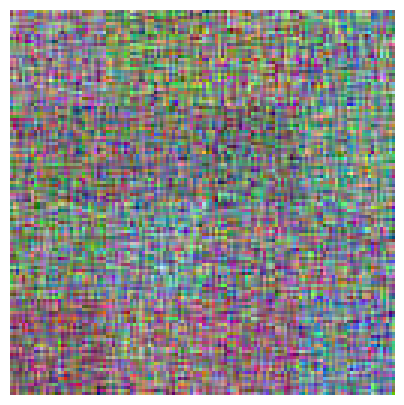

In [26]:
images = torch.randn(16, 4, 32, 32)
show_grid(images)

high_freq_ext = extract_high_frequencies_cv2(images, block_size=8, high_freqs=2)
show_grid(high_freq_ext)

low_freq_ext = extract_low_frequencies_cv2(images, block_size=8, low_freqs=2)
show_grid(low_freq_ext)

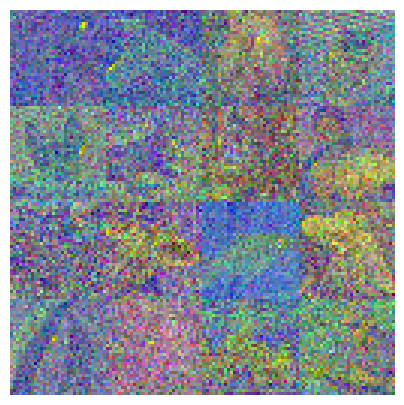

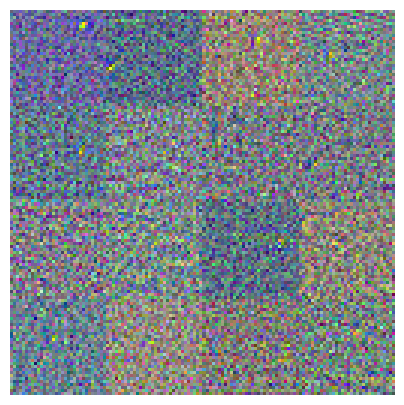

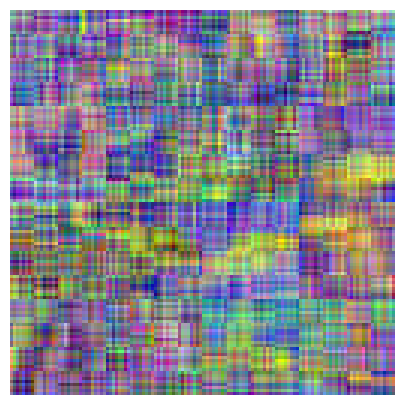

In [35]:
images = latents
show_grid(images)

high_freq_ext = extract_high_frequencies_cv2(images, block_size=8, high_freqs=2)
show_grid(high_freq_ext)

low_freq_ext = extract_low_frequencies_cv2(images, block_size=8, low_freqs=1)
show_grid(low_freq_ext)

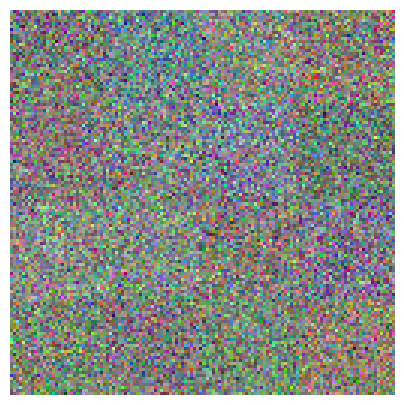

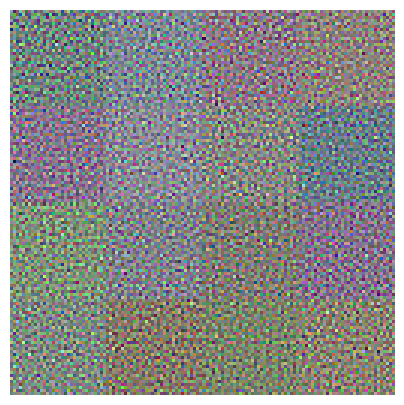

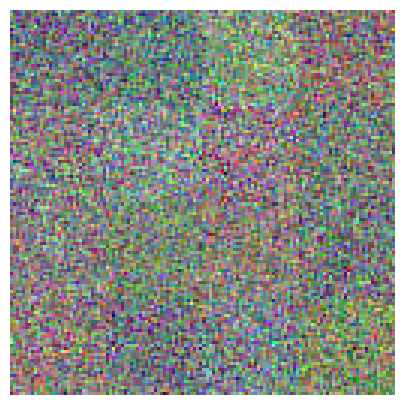

In [8]:
images = latents
show_grid(images)

high_freq_ext = extract_high_frequencies_cv2(images, block_size=8, high_freqs=4)
show_grid(high_freq_ext)

low_freq_ext = extract_low_frequencies_cv2(images, block_size=8, low_freqs=4)
show_grid(low_freq_ext)

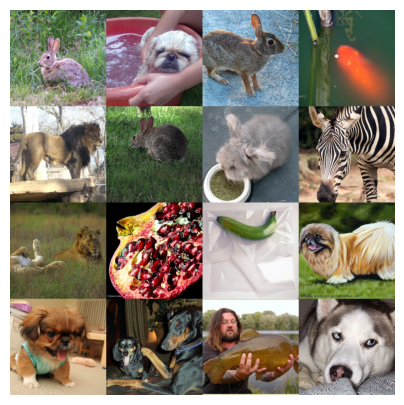

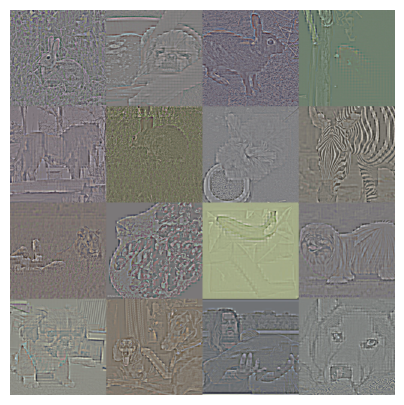

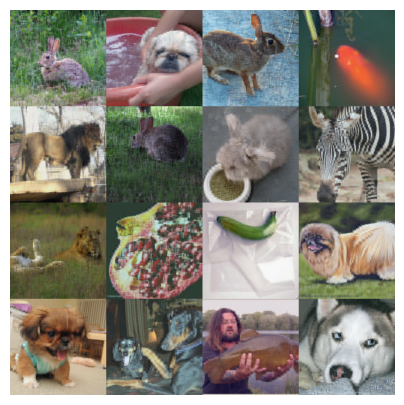

MSE: 0.010770738124847412


In [13]:
images = images
show_grid(images)

high_freq_ext = extract_high_frequencies_cv2(images, block_size=8, high_freqs=1)
show_grid(high_freq_ext)

low_freq_ext = extract_low_frequencies_cv2(images, block_size=8, low_freqs=1)
show_grid(low_freq_ext)


mse = F.mse_loss(images, low_freq_ext)
print(f"MSE: {mse}")

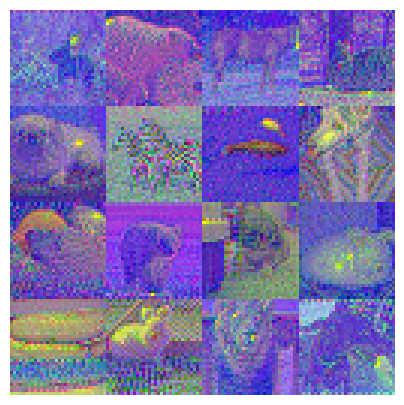

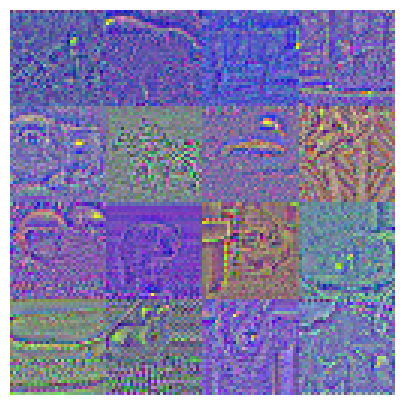

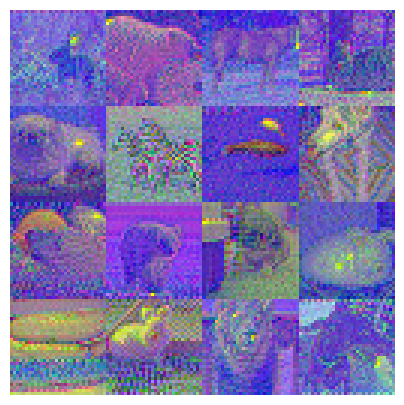

In [ ]:
images = latents_x1
show_grid(images)

high_freq_ext = extract_high_frequencies_cv2(images, block_size=8, high_freqs=2)
show_grid(high_freq_ext)

low_freq_ext = extract_low_frequencies_cv2(images, block_size=8, low_freqs=20)
show_grid(low_freq_ext)

mse = F.mse_loss(images, low_freq_ext)
print(f"MSE: {mse}")

-----
### Patching with DCT

In [14]:
import torch
import torch.nn as nn
import numpy as np

def zigzag_order(shape):
    """
    Generate the zigzag scan order for a 2D matrix of given shape.
    Returns the linear index order of a zigzag traversal.
    """
    rows, cols = shape
    result = []
    for sum_idx in range(rows + cols - 1):
        if sum_idx % 2 == 0:
            # Traverse diagonally from bottom-left to top-right
            start_row = min(sum_idx, rows - 1)
            start_col = sum_idx - start_row
            while start_row >= 0 and start_col < cols:
                result.append((start_row, start_col))
                start_row -= 1
                start_col += 1
        else:
            # Traverse diagonally from top-right to bottom-left
            start_col = min(sum_idx, cols - 1)
            start_row = sum_idx - start_col
            while start_col >= 0 and start_row < rows:
                result.append((start_row, start_col))
                start_row += 1
                start_col -= 1
    return result

# Define the DCTEmbedder
class DCTEmbedder(nn.Module):
    def __init__(self, patch_size=2, in_channels=4, embed_dim=768, norm='ortho'):
        super().__init__()
        self.patch_size = patch_size
        self.in_channels = in_channels
        self.embed_dim = embed_dim
        self.norm = norm

        # Linear projection layer
        self.proj = nn.Linear(in_channels * patch_size * patch_size, embed_dim)

        # Zigzag order for 2D patches
        self.zigzag_order = zigzag_order((patch_size, patch_size))

    def forward(self, x):
        B, C, H, W = x.shape
        assert H % self.patch_size == 0 and W % self.patch_size == 0

        # Step 1: Split into patches
        x = x.unfold(2, self.patch_size, self.patch_size).unfold(3, self.patch_size, self.patch_size)
        x = x.permute(0, 2, 3, 1, 4, 5)
        B, Hp, Wp, C, P1, P2 = x.shape
        x = x.reshape(B, Hp * Wp, C, P1, P2)

        # Step 2: Apply DCT on each patch
        dct_patches = dct_2d(x, norm=self.norm)  # Apply DCT on each patch

        # Step 3: Convert to real part
        dct_patches = dct_patches.real

        # Step 4: Zigzag reorder the DCT patches
        zigzag_dct_patches = []
        for i in range(B):
            for j in range(Hp * Wp):
                patch = dct_patches[i, j]  # (C, P, P)
                reordered_patch = patch.flatten(start_dim=1).index_select(1, 
                    torch.tensor([self.zigzag_order[k][0] * P2 + self.zigzag_order[k][1] 
                    for k in range(P1 * P2)], dtype=torch.long).to(x.device))
                zigzag_dct_patches.append(reordered_patch)
        zigzag_dct_patches = torch.stack(zigzag_dct_patches).view(B, Hp * Wp, C, P1 * P2)

        # Step 5: Flatten the patches
        dct_patches = zigzag_dct_patches.flatten(2)

        # Step 6: Project to embed_dim
        tokens = self.proj(dct_patches)
        return tokens


# Define the DCTDecoder
class DCTDecoder(nn.Module):
    def __init__(self, patch_size=2, in_channels=4, embed_dim=768, norm='ortho'):
        super().__init__()
        self.patch_size = patch_size
        self.in_channels = in_channels
        self.embed_dim = embed_dim
        self.norm = norm

        # Linear projection layer to project back to original patch size
        self.proj = nn.Linear(embed_dim, in_channels * patch_size * patch_size)

        # Zigzag order for 2D patches
        self.zigzag_order = zigzag_order((patch_size, patch_size))

    def forward(self, x):
        B, N, _ = x.shape

        # Step 1: Project back to patch size (C * P * P)
        dct_patches = self.proj(x)

        # Step 2: Unflatten to (B, N, C, P, P)
        dct_patches = dct_patches.unflatten(2, (self.in_channels, self.patch_size, self.patch_size))

        # Step 3: Reverse zigzag order (B, N, C, P, P)
        zigzag_dct_patches = []
        for i in range(B):
            for j in range(N):
                patch = dct_patches[i, j]
                original_patch = patch.flatten(start_dim=1).index_select(1, 
                    torch.tensor([self.zigzag_order[k][0] * self.patch_size + self.zigzag_order[k][1] 
                    for k in range(self.patch_size * self.patch_size)], dtype=torch.long).to(x.device))
                zigzag_dct_patches.append(original_patch)
        zigzag_dct_patches = torch.stack(zigzag_dct_patches).view(B, N, self.in_channels, self.patch_size, self.patch_size)

        # Step 4: Apply IDCT
        x = idct_2d(zigzag_dct_patches, norm=self.norm)

        # Step 5: Reassemble the image
        x = x.permute(0, 1, 3, 4, 2)  
        x = x.reshape(B, N, self.in_channels, self.patch_size, self.patch_size)  

        # Step 6: Fold patches into full image
        x = x.permute(0, 2, 3, 4, 1)
        x = x.contiguous().view(B, self.in_channels, self.patch_size, self.patch_size, N)

        B, C, P, P, N = x.shape
        H = W = int(N ** 0.5)  # Assuming N = Hp * Wp
        x = x.view(B, C, H, W, P, P)

        # Step 7: Combine patches
        x = x.permute(0, 1, 2, 4, 3, 5)
        x = x.contiguous().view(B, C, H * P, W * P)

        return x


torch.Size([16, 256, 768])


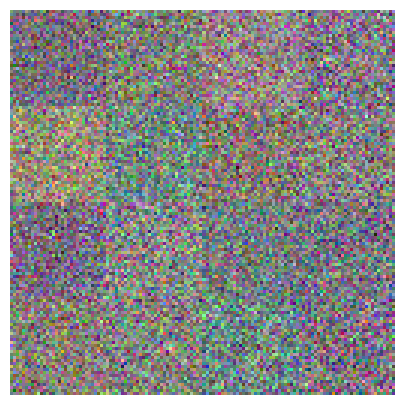

In [15]:
# Test the DCT Embedder
ipt = torch.randn(16, 4, 32, 32).to(DEV)
dct_embedder = DCTEmbedder(patch_size=2, in_channels=4, embed_dim=768).to(DEV)
dct_tokens = dct_embedder(ipt)
print(dct_tokens.shape)

source_img = ipt
show_grid(source_img)

torch.Size([16, 4, 32, 32])


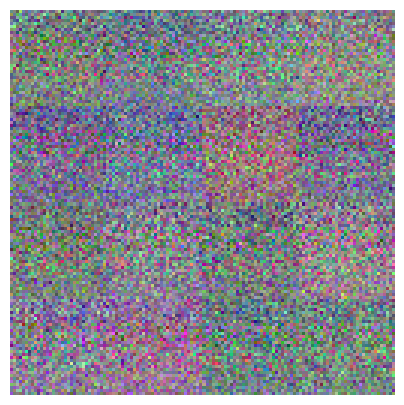

In [16]:
# Test the DCT Decoder
dct_decoder = DCTDecoder(patch_size=2, in_channels=4, embed_dim=768).to(DEV)
recon_img = dct_decoder(dct_tokens.to(DEV))
print(recon_img.shape)

show_grid(recon_img)

-----
Sanity Test


torch.Size([16, 256, 768])


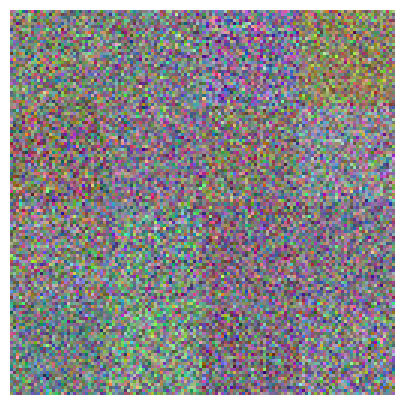

In [16]:
# Test the DCT Embedder
dct_embedder = DCTEmbedder(patch_size=2, in_channels=4, embed_dim=768).to(DEV)
dct_tokens = dct_embedder(latents.to(DEV))
print(dct_tokens.shape)

source_img = latents
show_grid(source_img)

torch.Size([16, 4, 32, 32])


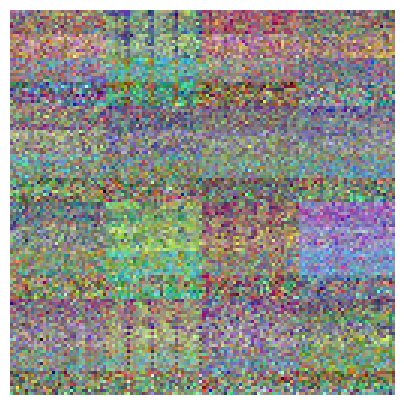

In [ ]:
# Test the DCT Decoder
dct_decoder = DCTDecoder(patch_size=2, in_channels=4, embed_dim=768).to(DEV)
recon_img = dct_decoder(dct_tokens.to(DEV))
print(recon_img.shape)

show_grid(recon_img)

--------
### Compare to HDF5 Samples

[HDF5DataModule] Setting base directory to /export/home/ra93jiz/dev/Img-IDM/dataset/processed/imagenet-256/imagenet256_data-T105723.hdf5
[HDF5LatentsDataset] Dataset size: 162929
[HDF5LatentsDataset] Dataset size: 32000
image                     torch.Size([16, 3, 256, 256])
latents_0.50              torch.Size([16, 4, 32, 32])
label                     torch.Size([16, 1])
Min images: -1.00, Max images: 1.01


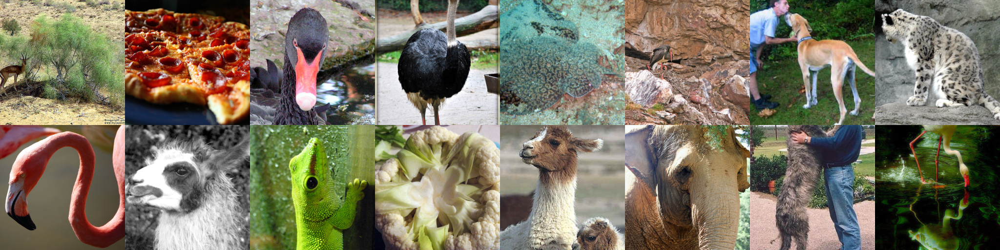

In [18]:
source_timestep = 0.5
target_timestep = 0.5
data_dir = './dataset/processed/imagenet-256/imagenet256_data-T105723.hdf5'

batch_size = 16
data = HDF5MultiDataModule(
    base_dir=data_dir,
    batch_size=batch_size,
    source_timestep=source_timestep,
    target_timestep=target_timestep,
    num_workers=2
)
data.setup(stage='fit')

for batch in data.train_dataloader():
    for k, v in batch.items():
        if isinstance(v, torch.Tensor) or isinstance(v, np.ndarray):
            print(f"{k:<25} {v.shape}")
        elif isinstance(v, list):
            print(f"{k:<25} [{v[0]}, ...]")
        else:
            print(f"{k:<25} {type(v)}")
    break

# Select a single batch
source_latents = batch[f'latents_{source_timestep:.2f}']
target_latents = batch[f'latents_{target_timestep:.2f}']

images = batch['image']
labels = batch['label']

print(f"Min images: {images.min():.2f}, Max images: {images.max():.2f}")

# Visualize
ims = tensor2im(images)  # Make sure this is defined
ims = ims_to_grid(ims, split=2, channel_last=True)  # Likewise, define or import
Image.fromarray(ims).show()


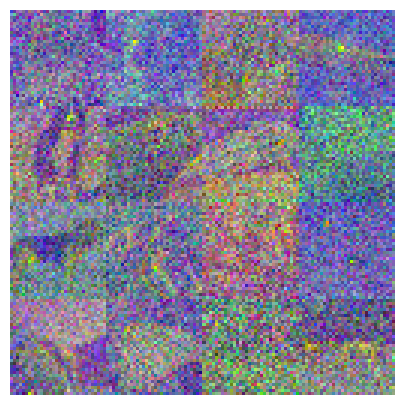

In [49]:
show_grid(target_latents)

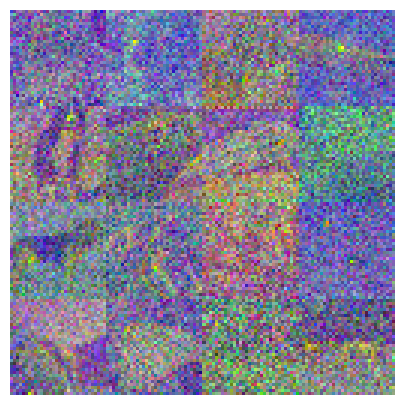

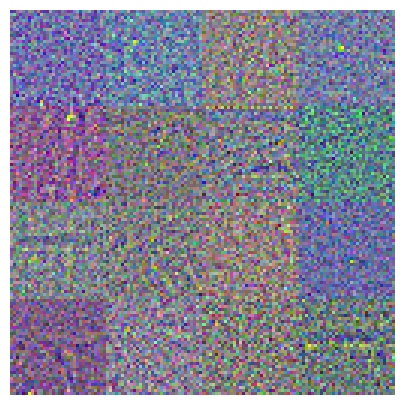

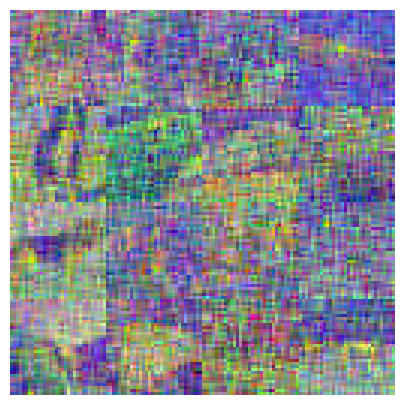

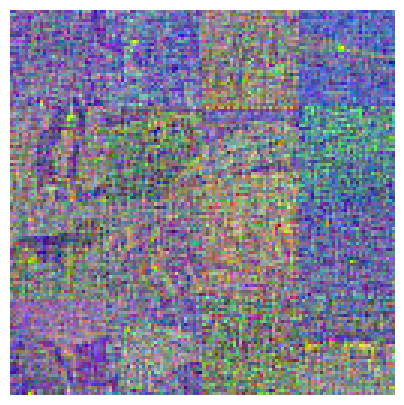

In [50]:
show_grid(source_latents)

high_freq_ext = extract_high_frequencies_cv2(source_latents, block_size=8, high_freqs=2)
show_grid(high_freq_ext)

low_freq_ext = extract_low_frequencies_cv2(source_latents, block_size=8, low_freqs=2)
show_grid(low_freq_ext)

out = low_freq_ext + high_freq_ext
show_grid(out)

--------
## Extract Frequencies with Torch DCT

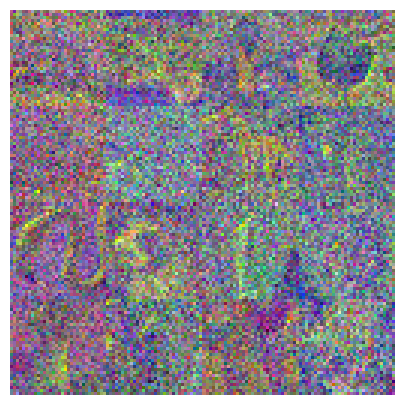

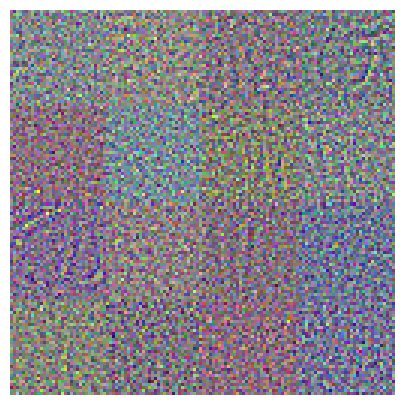

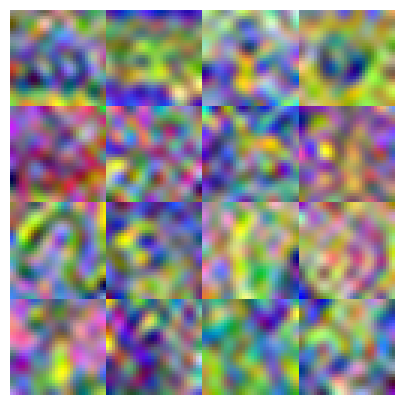

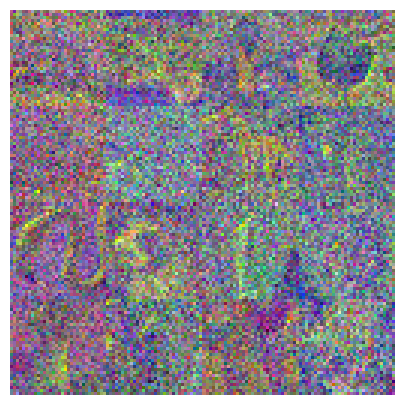

In [26]:
low_freq_ext, high_freq_ext = split_low_high_dct(source_latents, low_ratio=0.3, norm='ortho')

show_grid(source_latents)

show_grid(high_freq_ext)

show_grid(low_freq_ext)

out = low_freq_ext + high_freq_ext
show_grid(out)

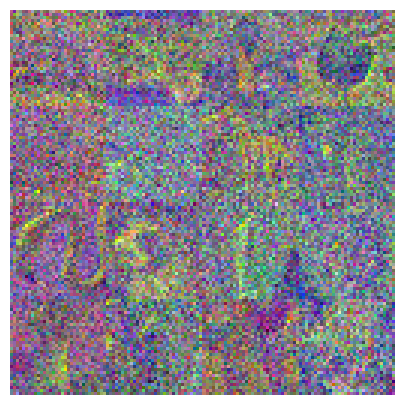

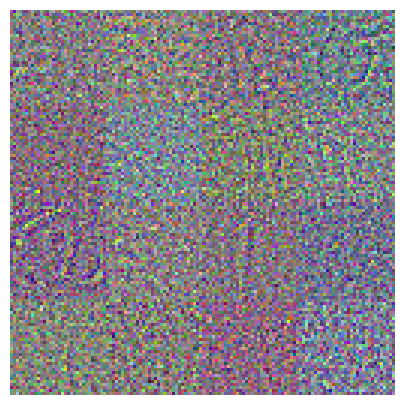

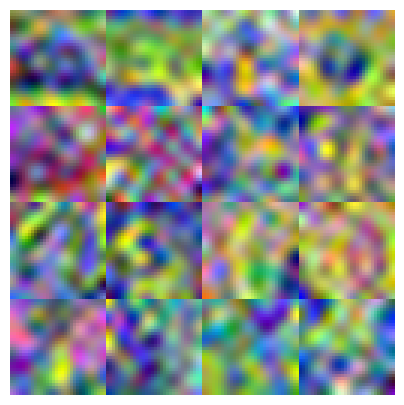

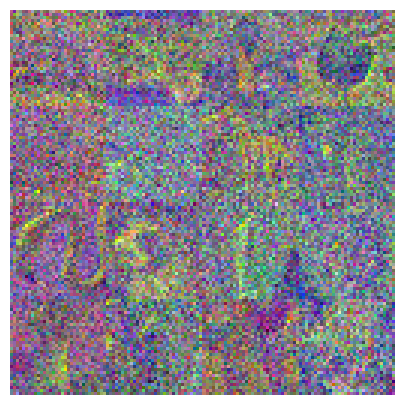

In [ ]:
low_freq_ext, high_freq_ext = split_low_high_dct(source_latents, low_ratio=0.25, norm='ortho')

show_grid(source_latents)

show_grid(high_freq_ext)

show_grid(low_freq_ext)

out = low_freq_ext + high_freq_ext
show_grid(out)

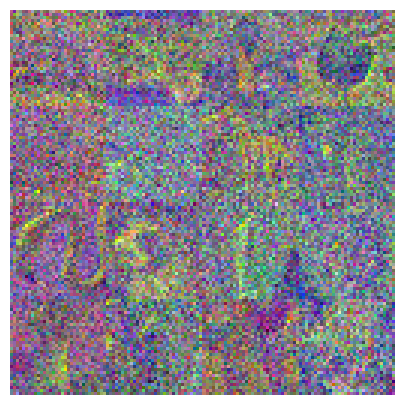

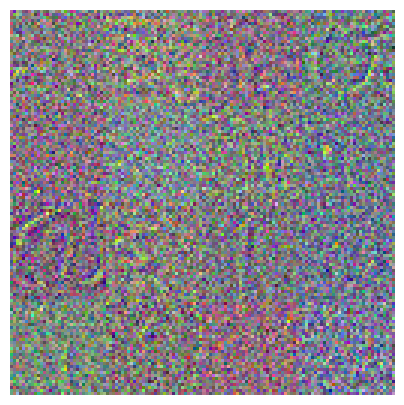

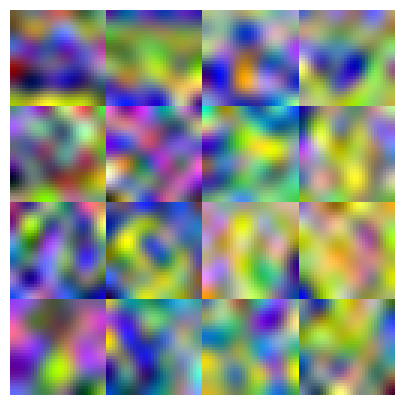

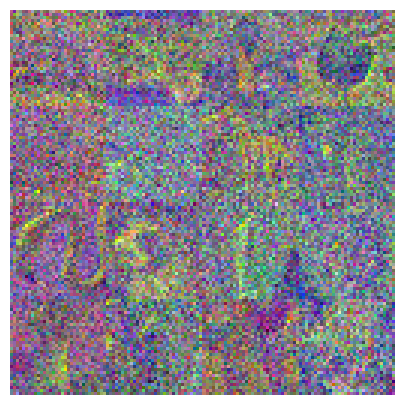

In [19]:
low_freq_ext, high_freq_ext = split_low_high_dct(source_latents, low_ratio=0.2, norm='ortho')

show_grid(source_latents)

show_grid(high_freq_ext)

show_grid(low_freq_ext)

out = low_freq_ext + high_freq_ext
show_grid(out)

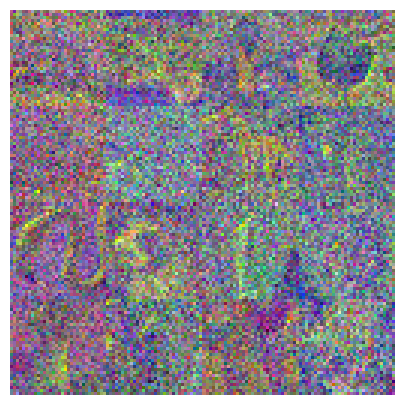

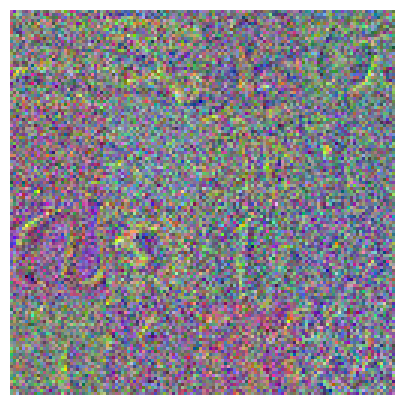

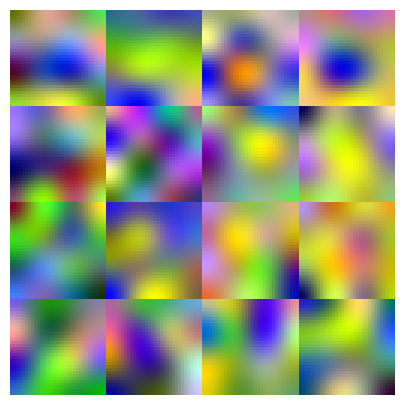

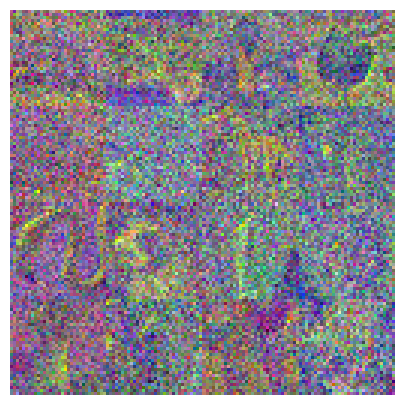

In [22]:
low_freq_ext, high_freq_ext = split_low_high_dct(source_latents, low_ratio=0.15, norm='ortho')

show_grid(source_latents)

show_grid(high_freq_ext)

show_grid(low_freq_ext)

out = low_freq_ext + high_freq_ext
show_grid(out)

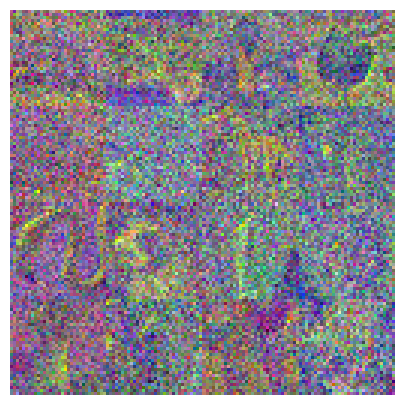

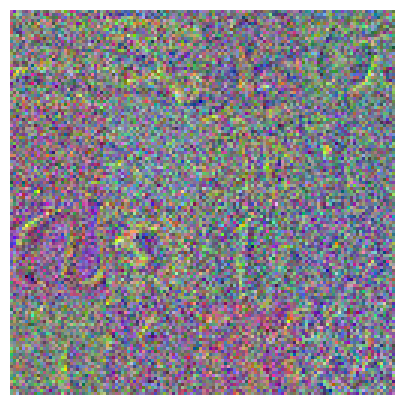

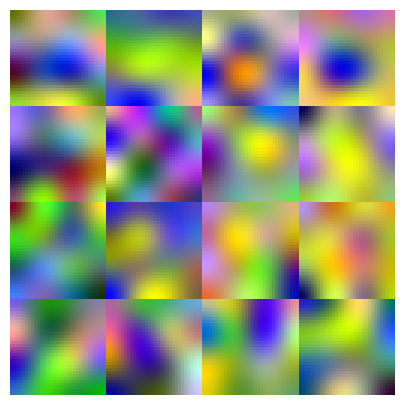

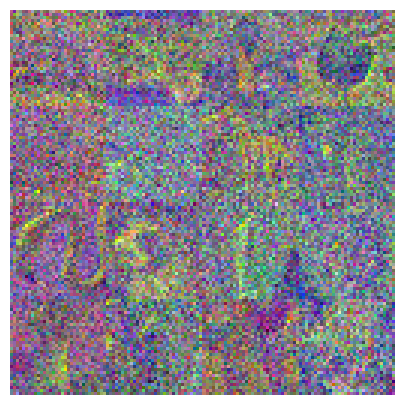

In [23]:
low_freq_ext, high_freq_ext = split_low_high_dct(source_latents, low_ratio=0.133333, norm='ortho')

show_grid(source_latents)

show_grid(high_freq_ext)

show_grid(low_freq_ext)

out = low_freq_ext + high_freq_ext
show_grid(out)

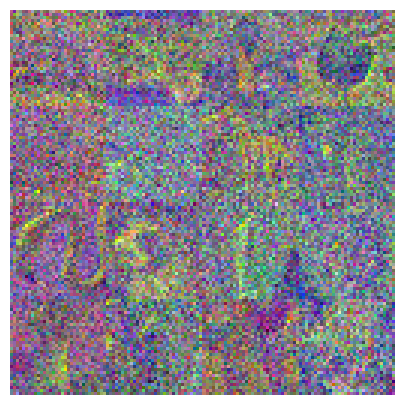

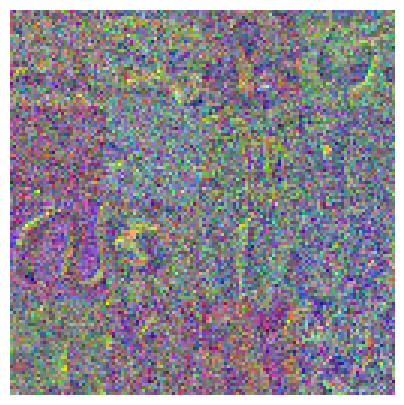

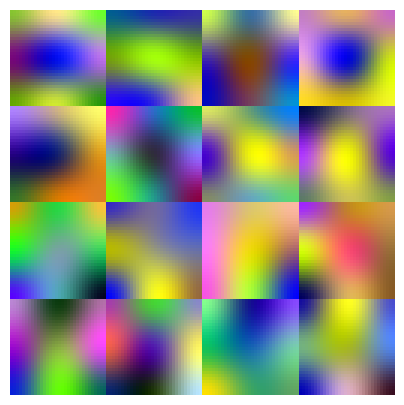

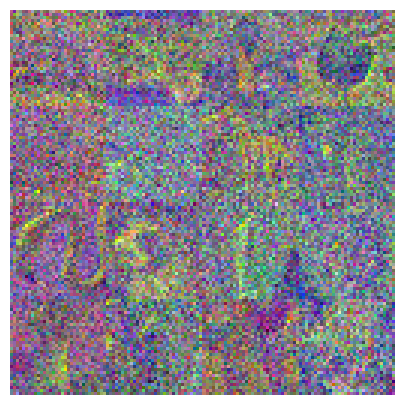

In [24]:
low_freq_ext, high_freq_ext = split_low_high_dct(source_latents, low_ratio=0.11111, norm='ortho')

show_grid(source_latents)

show_grid(high_freq_ext)

show_grid(low_freq_ext)

out = low_freq_ext + high_freq_ext
show_grid(out)

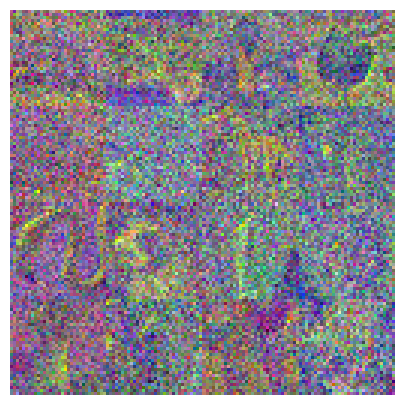

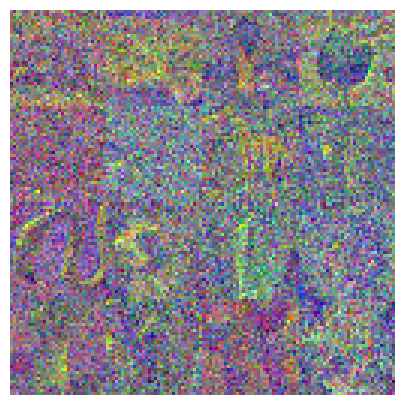

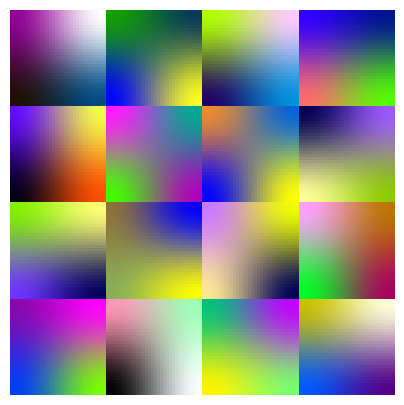

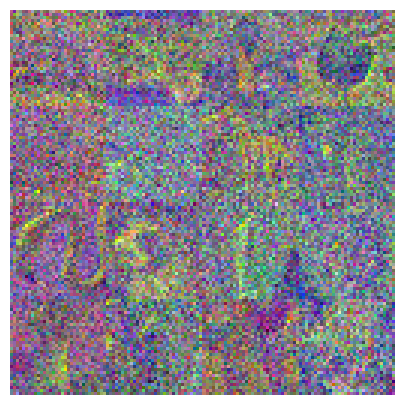

: 

In [ ]:
low_freq_ext, high_freq_ext = split_low_high_dct(source_latents, low_ratio=0.08, norm='ortho')

show_grid(source_latents)

show_grid(high_freq_ext)

show_grid(low_freq_ext)

out = low_freq_ext + high_freq_ext
show_grid(out)